In [26]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.distributions as distrib
import torch.distributions.transforms as transform
import argparse
import logging
import time
import datetime
from os.path import exists

import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim

import ot

import pyro
import pyro.contrib.examples.polyphonic_data_loader as poly
import pyro.distributions as dist
import pyro.poutine as poutine
from pyro.distributions import TransformedDistribution
from pyro.distributions.transforms import affine_autoregressive
from pyro.infer import SVI, JitTrace_ELBO, Trace_ELBO, TraceEnum_ELBO, TraceTMC_ELBO, config_enumerate
from pyro.optim import ClippedAdam

import mido
from mido import Message, MidiFile, MidiTrack, MetaMessage

from midi2audio import FluidSynth

import pretty_midi
from scipy.io import wavfile

import wave

# 障害物関数

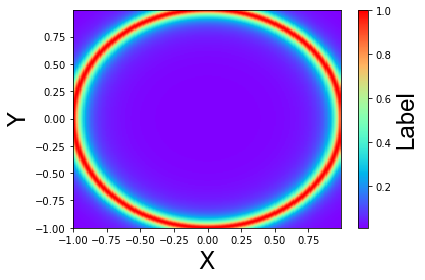

In [18]:

x = np.arange(-1, 1, 0.01) #x軸の描画範囲の生成。0から10まで0.05刻み。
y = np.arange(-1, 1, 0.01) #y軸の描画範囲の生成。0から10まで0.05刻み。

X, Y = np.meshgrid(x, y)
x_obs = 0
y_obs = 0
r_obs = 0.5
sigma = 100
Z = 1/(1 + sigma*((X-x_obs)**2 + (Y-y_obs)**2 - r_obs**2)**2)  # 表示する計算式の指定。等高線はZに対して作られる。

plt.pcolormesh(X, Y, Z, cmap='rainbow') # 等高線図の生成。cmapで色付けの規則を指定する。
plt.pcolor(X, Y, Z, cmap='rainbow') # 等高線図の生成。cmapで色付けの規則を指定する。

pp=plt.colorbar (orientation="vertical") # カラーバーの表示 
pp.set_label("Label", fontname="Arial", fontsize=24) #カラーバーのラベル

plt.xlabel('X', fontsize=24)
plt.ylabel('Y', fontsize=24)

plt.show()

# ベルヌーイ分布の性質

In [36]:
import pyro.distributions as dist
probs = torch.tensor(0.5)
probs = nn.Parameter(probs)
p = dist.Bernoulli(probs=probs)
sample = p.sample()

In [37]:
sample

tensor(1.)

# 勾配が無限大になるかどうか

In [58]:
probs = torch.rand(88, requires_grad = True)
# probs[0] = torch.tensor(0., requires_grad = True)
eps = torch.rand(88)
# h3 = torch.log(eps+1e-6) - torch.log(1-eps+1e-6) + torch.log(probs+1e-6) - torch.log(1-probs+1e-6)
h3 = torch.log(eps) - torch.log(1-eps) + torch.log(probs) - torch.log(1-probs)
print(h3)
ps = torch.sigmoid(h3)

print(probs)
print(ps)

ps_sum = torch.sum(ps)
print(ps_sum)
ps_sum.backward()
print(probs.grad)

tensor([-1.1759,  1.7988, -2.0492,  2.5193, -2.0192,  4.6584,  0.7469,  1.6995,
         2.4149,  0.5924,  3.7913, -0.5510,  3.5740,  1.2757, -0.6657,  0.2677,
         1.9952, -2.8950,  1.9179,  2.4237, -1.7021,  1.1958,  1.3709,  1.2756,
         2.2525,  0.4328, -0.0433,  0.9253,  1.4526, -3.5319, -0.5859,  0.5672,
         2.6243,  0.5934,  1.3049,  0.5689, -0.5697, -2.6100,  2.7173,  7.3845,
        -1.7710,  1.0232,  2.7550, -2.6154, -2.1719,  0.9313, -0.4310,  1.4718,
         3.2802, -1.8251, -1.4094, -0.8616, -0.9522,  0.5277,  0.6250, -0.8118,
         0.8804, -4.8643, -1.4553,  0.0218,  1.0261,  1.1022, -0.0723,  0.5712,
         0.1568,  1.2950,  0.5043,  2.0528, -4.5724, -0.5800,  3.0492, -2.0158,
        -3.7694, -3.1296,  0.0669, -1.2808, -0.5684, -1.6475,  1.2204,  3.0389,
        -4.6177, -0.1467,  1.6360, -1.1624,  2.3709, -1.7739, -2.8755,  3.1712],
       grad_fn=<SubBackward0>)
tensor([0.3773, 0.6972, 0.4883, 0.6044, 0.8419, 0.9303, 0.3909, 0.8884, 0.9350,
        

# MIDI編集

In [68]:
pm = pretty_midi.PrettyMIDI(resolution=960, initial_tempo=120) #pretty_midiオブジェクトを作ります
instrument = pretty_midi.Instrument(0) #instrumentはトラックみたいなものです。

note_number = pretty_midi.note_name_to_number('G4')
note = pretty_midi.Note(velocity=100, pitch=note_number, start=0, end=1) #noteはNoteOnEventとNoteOffEventに相当します。
instrument.notes.append(note)

note_number = pretty_midi.note_name_to_number('E4')
note = pretty_midi.Note(velocity=100, pitch=note_number, start=1, end=2) #noteはNoteOnEventとNoteOffEventに相当します。
instrument.notes.append(note)

note_number = pretty_midi.note_name_to_number('A4')
note = pretty_midi.Note(velocity=100, pitch=note_number, start=3, end=4) #noteはNoteOnEventとNoteOffEventに相当します。
instrument.notes.append(note)

pm.instruments.append(instrument)
pm.write('test.mid') #midiファイルを書き込みます。

In [107]:
def save_as_midi(song, length, path="", name="default.mid", BPM = 120, velocity = 100):
    pm = pretty_midi.PrettyMIDI(resolution=960, initial_tempo=BPM) #pretty_midiオブジェクトを作ります
    instrument = pretty_midi.Instrument(0) #instrumentはトラックみたいなものです。
    for i,tones in enumerate(song):
        which_tone = (tones == 1).nonzero().reshape(-1)
        if len(which_tone) == 0:
            note = pretty_midi.Note(velocity=0, pitch=0, start=i, end=i+1) #noteはNoteOnEventとNoteOffEventに相当します。
            instrument.notes.append(note)
        else:
            for which in which_tone:
                note = pretty_midi.Note(velocity=velocity, pitch=which, start=i, end=i+1) #noteはNoteOnEventとNoteOffEventに相当します。
                instrument.notes.append(note)

    pm.write(os.path.join(path, name)) #midiファイルを書き込みます。


def midi_to_wav(midi_name, midi_path="", wav_name = None, wav_path="", rate=44100):
    if wav_name == None:
        wav_name = os.path.join(os.path.splitext(os.path.basename(midi_name))[0],\
                                ".wav")
    midi_data = pretty_midi.PrettyMIDI(midi_name) #midiファイルを読み込みます
    data = np.array(midi_data.synthesize()*1e5, dtype = "int16")
    write(os.path.join(path, wav_name), rate, data )

In [70]:
midi_data = pretty_midi.PrettyMIDI('test.mid') #midiファイルを読み込みます
print(midi_data.get_piano_roll()) #ピアノロールを出力します
print(midi_data.synthesize()) #サイン波を使って、波形を出力します。

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
[0.        0.0558516 0.1115265 ... 0.        0.        0.       ]


[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

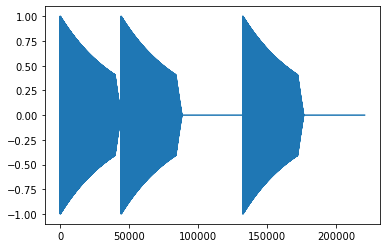

In [95]:
plt.plot(midi_data.synthesize())
len(midi_data.get_piano_roll()[1])
print(midi_data.get_piano_roll()[120])

In [88]:
sample_rate = 44100
path = "test12.wav"
write_wav(midi_data.synthesize(), path, sample_rate)

In [105]:
from scipy.io.wavfile import write
data = np.array(midi_data.synthesize()*1e5, dtype = "int16")

write('out.wav', sample_rate, data )

# 混合ガウス分布の描画

In [41]:
x = np.linspace(-10, 10, 1000)
z = np.array(np.meshgrid(x, x)).transpose(1, 2, 0)
z = np.reshape(z, [z.shape[0] * z.shape[1], -1])

## 円形の点座標を出力 ##
def circle_dots(r, N_points):
    pi = torch.tensor(3.14159265359)
    dots = torch.tensor([[r*torch.cos(i * 2 * pi / N_points), r*torch.sin(i * 2 * pi / N_points)] for i in range(N_points)])
    return dots

def multi_Gaussian(dots, std, z):
    log_probs = torch.exp(distrib.MultivariateNormal(dots[0], std*torch.eye(2)).log_prob(torch.Tensor(z)))
    for i in range(1,len(dots)):
        log_probs += torch.exp(distrib.MultivariateNormal(dots[i], std*torch.eye(2)).log_prob(torch.Tensor(z)))
    return log_probs/len(dots)

In [37]:
a = circle_dots(1.,8)

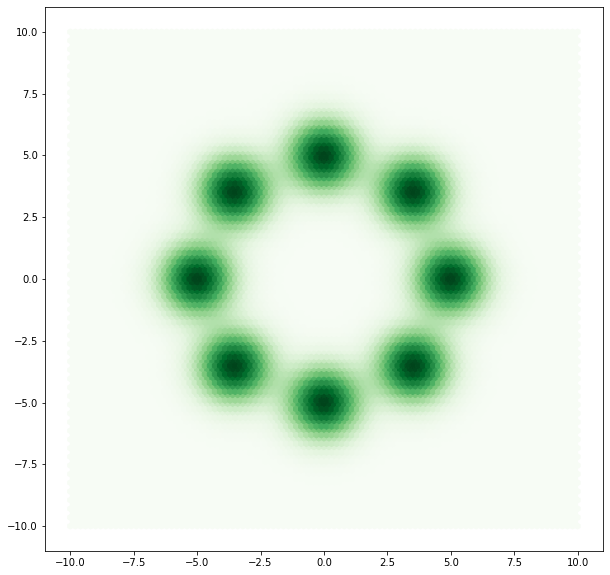

In [47]:
plt.figure(figsize=(10,10))
plt.hexbin(z[:,0], z[:,1], C=multi_Gaussian(circle_dots(5,8),1,z), cmap='Greens')

# sin波の出力

MovieWriter imagemagick unavailable; using Pillow instead.


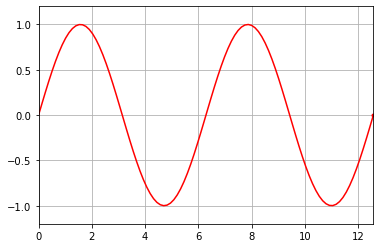

In [40]:
xaxis_Max = 4*np.pi
interval = 100

fig = plt.figure(1)
ax = fig.add_subplot(111)
plt.xlim(0,xaxis_Max)
plt.ylim(-1.2,1.2)
plt.grid()
x = np.linspace(0,xaxis_Max,interval)

line, = ax.plot(x[0], np.sin(x[0]), "r")
dot, = ax.plot(x[0], np.sin(x[0]), ".", color="red")

def update(i):
    line.set_data(x[:i+1], np.sin(x[:i+1]))
    dot.set_data(x[i], np.sin(x[i]))


# ims = []
# for i in range(interval):
#     y = np.sin(x[:i+1])
#     line, = plt.plot(x[:i],y[:i],"r")
#     ims.append([line])
#     line, = plt.plot(x[i],y[i],".")
#     ims.append([line])

# ani = animation.ArtistAnimation(fig, ims)

ani = animation.FuncAnimation(fig, update, interval, blit=False, interval=10, repeat=False)
ani.save('anim.gif', writer="imagemagick")

# Wassの計算

In [75]:
#　曲数
N = 10

#ドレミ系
def easyTones(N):
    max = 70
    interval = 10
    training_seq_lengths = torch.tensor([8]*N)
    training_data_sequences = torch.zeros(N,8,88)
    for i in range(N):
        training_data_sequences[i][0][int(max-i*interval)  ] = 1
        training_data_sequences[i][1][int(max-i*interval)+2] = 1
        training_data_sequences[i][2][int(max-i*interval)+4] = 1
        training_data_sequences[i][3][int(max-i*interval)+5] = 1
        training_data_sequences[i][4][int(max-i*interval)+7] = 1
        training_data_sequences[i][5][int(max-i*interval)+9] = 1
        training_data_sequences[i][6][int(max-i*interval)+11] = 1
        training_data_sequences[i][7][int(max-i*interval)+12] = 1
    return training_seq_lengths, training_data_sequences

## ドドド、レレレ
def superEasyTones(N):
    training_seq_lengths = torch.tensor([8]*N)
    training_data_sequences = torch.zeros(N,8,88)
    for i in range(N):
        for j in range(8):
            training_data_sequences[i][j][int(30+i*5)] = 1
    return training_seq_lengths, training_data_sequences

## ドドド、ドドド、ドドド
def easiestTones(N):
    training_seq_lengths = torch.tensor([8]*N)
    training_data_sequences = torch.zeros(N,8,88)
    for i in range(N):
        for j in range(8):
            training_data_sequences[i][j][int(70)] = 1
    return training_seq_lengths, training_data_sequences

## クラシック
data = poly.load_data(poly.JSB_CHORALES)
classic_mini_batch = data['train']['sequences'][:N,:8]

## ドレミ系
_,CDE_mini_batch = easyTones(N)

## ドドド、レレレ、ミミミ系
_,DDD_mini_batch = superEasyTones(N)

## ドドドだけ
_,CCC_mini_batch = easiestTones(N)

if classic_mini_batch.size() == CDE_mini_batch.size() and \
   classic_mini_batch.size() == DDD_mini_batch.size() and \
   classic_mini_batch.size() == CCC_mini_batch.size():
   print("SIZE =", classic_mini_batch.size())
   print("torch.Size([曲数, 曲の長さ, 鍵数])")
else :
    assert("ERROR!")

SIZE = torch.Size([10, 8, 88])
torch.Size([曲数, 曲の長さ, 鍵数])


In [36]:
def EMD(training_mini_batch, generated_mini_batch):
    # データの確認
    if training_mini_batch.size() != generated_mini_batch.size():
        assert("ERROR at Wass")

    # numpy バージョンの生成
    trn_np = training_mini_batch.detach().clone().numpy()
    gnt_np = generated_mini_batch.detach().clone().numpy()
    
    # 曲数
    n_songs = training_mini_batch.size()[0]
    # 曲の長さ
    n_tones = training_mini_batch.size()[1]
    # 鍵数
    dim = training_mini_batch.size()[2]
    
    trn_np = trn_np.reshape((n_songs, n_tones * dim))
    gnt_np = gnt_np.reshape((n_songs, n_tones * dim))
    
    # ot の使用
    M = ot.dist(trn_np, gnt_np)
    M /= M.max() #　不要かも
    a, b = np.ones((n_songs,)) / n_songs, np.ones((n_songs,)) / n_songs  # uniform distribution on samples
    gamma = ot.emd(a, b, M)

    # 近似計算の実行
    Tx = []
    for i in range(n_songs):
        ind = gamma[i,:].argmax()
        Tx.append(generated_mini_batch[ind])
    Tx = torch.stack(Tx)
    return torch.norm(Tx-training_mini_batch, dim=1).sum()

In [39]:
print(EMD(classic_mini_batch,classic_mini_batch))
print(EMD(classic_mini_batch,CCC_mini_batch))
print(EMD(CDE_mini_batch,CCC_mini_batch))

tensor(0.)
tensor(61.8017)
tensor(31.3026)


# 正規分布サンプリング

In [51]:
q0 = distrib.MultivariateNormal(torch.zeros(88), torch.eye(88))
samples = q0.sample((1000,10, ))

In [49]:
print(samples.size())

torch.Size([1000, 10, 88])


# polt.getの使い方

In [76]:
N_train_data = 10
training_data_sequences = classic_mini_batch
training_seq_lengths = torch.tensor([8,8,8,8,8,8,8,8,8,8])
shuffled_indices = torch.randperm(N_train_data)

In [78]:
 mini_batch, mini_batch_reversed, mini_batch_mask, mini_batch_seq_lengths \
                = poly.get_mini_batch(shuffled_indices, training_data_sequences,
                                        training_seq_lengths)

# Z0

In [95]:
z_dim = 100
z_0 = torch.zeros(z_dim)
z_pre = z_0.expand(10, z_0.size(0))

In [97]:
z_pre.size()

torch.Size([10, 100])